#**Face Recognition with VGG16 - Convolutional Neural Networks**
###**Artificial Intelligence project**

* Juan Sebastian Peña Valderrama



>**Objective:**
*This project focuses on the development of a robust human face recognition system using deep learning techniques, specifically leveraging VGG16 as the core convolutional neural network architecture. The work involves implementing the entire pipeline for face detection and classification, starting with comprehensive preprocessing steps such as image normalization, resizing, and data augmentation to ensure variability and improve the model’s generalization capacity.*

By applying transfer learning, the pretrained VGG16 model is used as a powerful feature extractor, while additional fully connected layers are fine-tuned to adapt the network to the specific task of human face identification. This approach significantly reduces training time and improves classification accuracy compared to training from scratch. Furthermore, the project integrates the evaluation of performance through accuracy metrics, confusion matrices, and loss/accuracy curves to analyze the model’s behavior during training and testing. The results demonstrate how pretrained CNN architectures can be effectively applied to real-world facial recognition problems, offering a solid foundation for more advanced biometric systems and practical applications in security, authentication, and human–computer interaction.

### Import Libraries

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import zipfile
import os
from PIL import Image
import cv2

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import classification_report

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

from tensorflow import keras
import tensorflow.keras.layers as LK
import tensorflow.keras.models as MK
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import Rescaling
from tensorflow.keras import regularizers

from keras.applications.vgg16 import preprocess_input
from keras.models import Model

### Import Dataset

In [ ]:
# Download the CelebFaces Attributes (CelebA) dataset from Kaggle.
# This dataset contains over 200,000 celebrity face images with attributes,
# commonly used for face recognition, facial attribute classification, and deep learning tasks.

!kaggle datasets download -d jessicali9530/celeba-dataset

Dataset URL: https://www.kaggle.com/datasets/jessicali9530/celeba-dataset
License(s): other
100% 1.33G/1.33G [01:03<00:00, 24.4MB/s]
100% 1.33G/1.33G [01:03<00:00, 22.6MB/s]


In [ ]:
# Define the path to the downloaded ZIP file and the path where the dataset will be extracted
zip_path = '/content/celeba-dataset.zip'
extract_path = '/content/celeba_dataset'

# Create the destination folder if it does not exist yet
os.makedirs(extract_path, exist_ok=True)

# Unzip the CelebA dataset into the target directory
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

# List the files and folders extracted to verify that the operation was successful
extracted_files = os.listdir(extract_path)
print("Extracted files:", extracted_files)

Archivos que se descomprimen: ['list_eval_partition.csv', 'list_landmarks_align_celeba.csv', 'list_attr_celeba.csv', 'img_align_celeba', 'list_bbox_celeba.csv']


In [ ]:
# Define the path to the CSV file that contains the attribute labels for the CelebA dataset
attributes_path = '/content/celeba_dataset/list_attr_celeba.csv'

# Load the attribute file into a Pandas DataFrame for easy manipulation and analysis
att = pd.read_csv(attributes_path)

# Display the first 10 rows of the DataFrame to inspect the structure and content of the attributes
att.head(10)

,image_id,5_o_Clock_Shadow,Arched_Eyebrows,Attractive,Bags_Under_Eyes,Bald,Bangs,Big_Lips,Big_Nose,Black_Hair,...,Sideburns,Smiling,Straight_Hair,Wavy_Hair,Wearing_Earrings,Wearing_Hat,Wearing_Lipstick,Wearing_Necklace,Wearing_Necktie,Young
0,000001.jpg,-1,1,1,-1,-1,-1,-1,-1,-1,...,-1,1,1,-1,1,-1,1,-1,-1,1
1,000002.jpg,-1,-1,-1,1,-1,-1,-1,1,-1,...,-1,1,-1,-1,-1,-1,-1,-1,-1,1
2,000003.jpg,-1,-1,-1,-1,-1,-1,1,-1,-1,...,-1,-1,-1,1,-1,-1,-1,-1,-1,1
3,000004.jpg,-1,-1,1,-1,-1,-1,-1,-1,-1,...,-1,-1,1,-1,1,-1,1,1,-1,1
4,000005.jpg,-1,1,1,-1,-1,-1,1,-1,-1,...,-1,-1,-1,-1,-1,-1,1,-1,-1,1
5,000006.jpg,-1,1,1,-1,-1,-1,1,-1,-1,...,-1,-1,-1,1,1,-1,1,-1,-1,1
6,000007.jpg,1,-1,1,1,-1,-1,1,1,1,...,-1,-1,1,-1,-1,-1,-1,-1,-1,1
7,000008.jpg,1,1,-1,1,-1,-1,1,-1,1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,1
8,000009.jpg,-1,1,1,-1,-1,1,1,-1,-1,...,-1,1,-1,-1,1,-1,1,-1,-1,1
9,000010.jpg,-1,-1,1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,1,-1,-1,1,-1,-1,1


In [ ]:
# Print the names of all the columns (features) in the DataFrame
print("Feature names:")
print(att.columns.tolist())

Nombres de las características:
['image_id', '5_o_Clock_Shadow', 'Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips', 'Big_Nose', 'Black_Hair', 'Blond_Hair', 'Blurry', 'Brown_Hair', 'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 'Eyeglasses', 'Goatee', 'Gray_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'Male', 'Mouth_Slightly_Open', 'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Sideburns', 'Smiling', 'Straight_Hair', 'Wavy_Hair', 'Wearing_Earrings', 'Wearing_Hat', 'Wearing_Lipstick', 'Wearing_Necklace', 'Wearing_Necktie', 'Young']


In [ ]:
# Rename the column 'Male' to 'Genero' to make it more descriptive
att.rename(columns={'Male': 'Genero'}, inplace=True)

# Create a new DataFrame with only two columns: image_id and Genero
att_ = att[['image_id', 'Genero']]

# Replace the label -1 (representing female) with 0 for clarity in binary classification
att_['Genero'] = att_['Genero'].replace(-1, 0)

# Display the first 10 rows of the updated DataFrame
att_.head(10)

<ipython-input-6-a4d151eda8a4>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  att_['Genero'] = att_['Genero'].replace(-1, 0)


,image_id,Genero
0,000001.jpg,0
1,000002.jpg,0
2,000003.jpg,1
3,000004.jpg,0
4,000005.jpg,0
5,000006.jpg,0
6,000007.jpg,1
7,000008.jpg,1
8,000009.jpg,0
9,000010.jpg,0


### Examples from the Dataset

Género masculino (1):


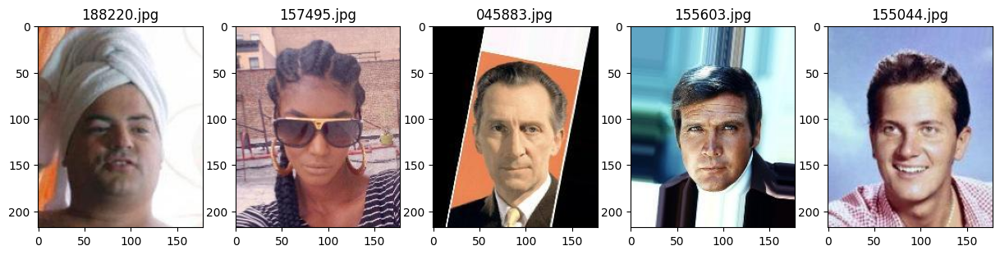

Género femenino (0):


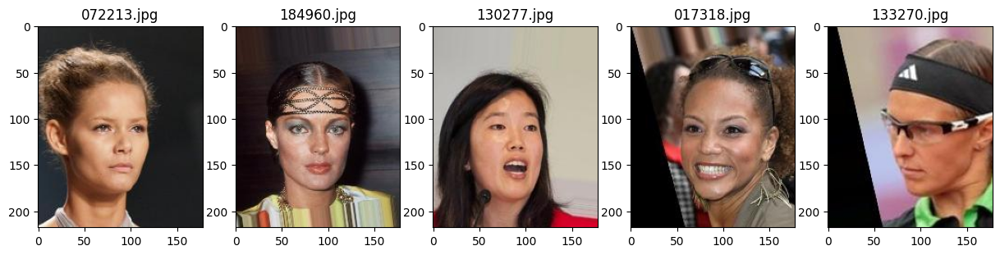

In [ ]:
# Define the path where the CelebA images are stored
images_path = '/content/celeba_dataset/img_align_celeba/img_align_celeba'

# Define a function to display sample images of a specific gender
def show_images_by_gender(df, gender, images_path, num_images=5):
    # Filter the DataFrame to get only the rows corresponding to the selected gender
    df_gender = df[df['Genero'] == gender]

    # Randomly select 'num_images' image names from the filtered dataset
    sample_images = df_gender.sample(n=num_images)['image_id'].tolist()

    # Create a figure to display the images side by side
    plt.figure(figsize=(15, 5))
    for i, img_name in enumerate(sample_images):
        # Build the complete path to the image
        img_path = os.path.join(images_path, img_name)

        # Read the image
        img = plt.imread(img_path)

        # Plot the image in a subplot
        plt.subplot(1, num_images, i+1)
        plt.imshow(img)
        plt.title(f"{img_name}")
        plt.axis('off')  # Hide axes for a cleaner visualization
    plt.show()

# Display 5 random images for each gender
print("Género masculino (1):")
show_images_by_gender(att_, gender=1, images_path=images_path, num_images=5)  # Male gender

print("Género femenino (0):")
show_images_by_gender(att_, gender=0, images_path=images_path, num_images=5)  # Female gender

### Data Preprocessing

In [ ]:
# Two strategies are applied to reduce the amount of memory used
# when handling the entire dataset:
# 1. Take a random batch of 10,000 images instead of the full dataset.
# 2. Resize each image to (224, 224) to reduce computational cost.
# This makes it more efficient to process the images later with the VGG16 model.

sample_size = 10000
att_sample = att_.sample(n=sample_size, random_state=42)  # Random sample of 10,000 images

# Target resize dimensions (width, height)
image_size = (224, 224)

# Lists to store the processed images and their corresponding labels
X = []
y = []

# Load and process each selected image
for idx, row in att_sample.iterrows():
    img_path = os.path.join(images_path, row['image_id'])  # Full path of the image
    with Image.open(img_path) as img:
        img = img.resize(image_size)          # Resize image to 224x224
        img_array = np.array(img)             # Convert image to NumPy array
        X.append(img_array)                   # Store processed image
        y.append(row['Genero'])               # Store corresponding label (0 or 1)

# Convert the lists to NumPy arrays for model compatibility
X = np.array(X)
y = np.array(y)

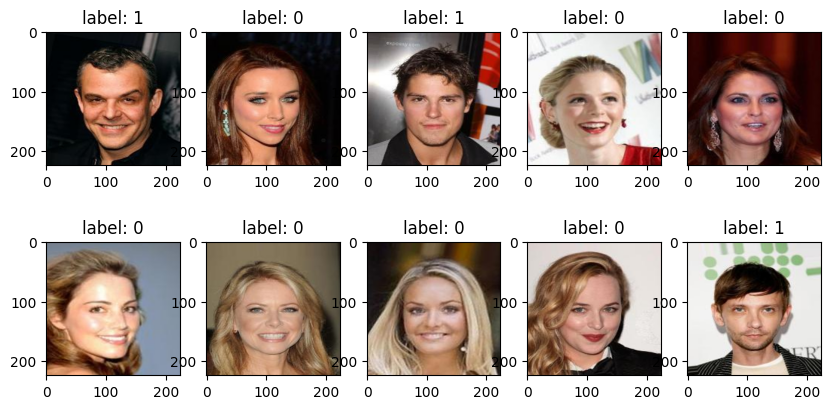

dimensiones de X: (10000, 224, 224, 3)
dimensión de y: (10000,)


In [ ]:
# Display 10 random images from the sampled dataset
# This step is useful to visually verify that the images were correctly
# loaded, resized, and labeled.

random_indices = np.random.choice(sample_size, size=10, replace=False)  # Select 10 random indices

plt.figure(figsize=(10, 5))  # Set the size of the visualization grid

# Loop through the selected random indices
for i, idx in enumerate(random_indices):
    plt.subplot(2, 5, i+1)         # Create a 2x5 grid of subplots
    plt.imshow(X[idx])            # Display the image at the selected index
    plt.title(f"label: {y[idx]}") # Show the corresponding label (0 = female, 1 = male)

plt.show()

# Print the shape of the image dataset and the labels array
print(f"dimensiones de X: {X.shape}")  # Shape of X: (number of images, height, width, channels)
print(f"dimensión de y: {y.shape}")   # Shape of y: (number of labels)

### VGG16 Training and Validation

In [ ]:
# Split the dataset into training and testing sets
# Stratified sampling ensures both sets have the same proportion of genders.

X_train, X_test, y_train, y_test = train_test_split(
    X,                      # Features (images)
    y,                      # Labels (0 = female, 1 = male)
    test_size=0.2,          # 20% of the data will be used for testing
    random_state=42,        # Fixed seed for reproducibility
    stratify=y              # Maintain class balance in train and test sets
)

# Print the shapes of the resulting datasets to verify the split
print("dimensiones de X_train:", X_train.shape)  # Training images
print("dimensiones de X_test:", X_test.shape)    # Testing images
print("dimensiones de y_train:", y_train.shape)  # Training labels
print("dimensiones de y_test:", y_test.shape)    # Testing labels

dimensiones de X_train: (8000, 224, 224, 3)
dimensiones de X_test: (2000, 224, 224, 3)
dimensiones de y_train: (8000,)
dimensiones de y_test: (2000,)


0: 4655 imágenes
1: 3345 imágenes


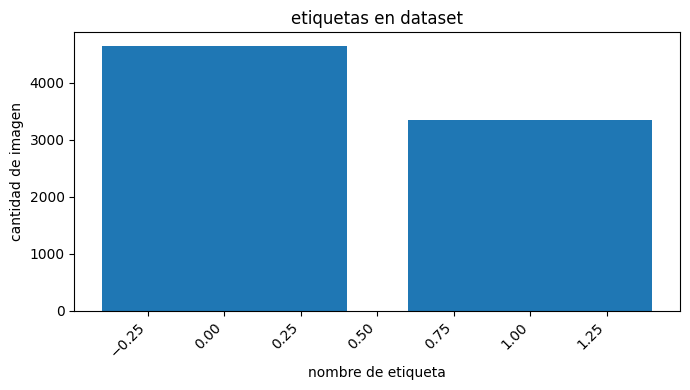

In [ ]:
# Function to display the distribution of labels in the dataset
def dist_datos(label):
    # Count how many images correspond to each unique label (0 or 1)
    etiquetas_unicas, conteo_etiquetas = np.unique(label, return_counts=True)

    # Print the number of images for each label in the console
    for i, nombre_etiqueta in enumerate(etiquetas_unicas):
        print(f"{nombre_etiqueta}: {conteo_etiquetas[i]} imágenes")

    # Create a bar chart to visualize the class distribution
    plt.figure(figsize=(7, 4))
    plt.bar(etiquetas_unicas, conteo_etiquetas)
    plt.xlabel('nombre de etiqueta')         # Label on x-axis
    plt.ylabel('cantidad de imagen')         # Label on y-axis
    plt.title('etiquetas en dataset')        # Plot title
    plt.xticks(rotation=45, ha='right')      # Rotate x-axis labels for readability
    plt.tight_layout()
    plt.show()

# Display label distribution for the training set
dist_datos(y_train)

In [ ]:
# Define the input shape of the images (224 x 224 pixels with 3 color channels - RGB)
input_shape = (224, 224, 3)

# Define the VGG16-like CNN model using Sequential API
modelo = Sequential([

    # Normalization layer — standardizes inputs to stabilize and speed up training
    BatchNormalization(input_shape=input_shape),

    # Convolutional Block 1
    Conv2D(64, (3, 3), activation='relu', padding='same'),  # 1st Conv layer with 64 filters
    Conv2D(64, (3, 3), activation='relu', padding='same'),  # 2nd Conv layer with 64 filters
    MaxPooling2D((2, 2), strides=(2, 2)),                   # Downsampling with max pooling

    # Convolutional Block 2
    Conv2D(128, (3, 3), activation='relu', padding='same'), # 1st Conv layer with 128 filters
    Conv2D(128, (3, 3), activation='relu', padding='same'), # 2nd Conv layer with 128 filters
    MaxPooling2D((2, 2), strides=(2, 2)),

    # Convolutional Block 3
    Conv2D(256, (3, 3), activation='relu', padding='same'), # 1st Conv layer with 256 filters
    Conv2D(256, (3, 3), activation='relu', padding='same'), # 2nd Conv layer
    Conv2D(256, (3, 3), activation='relu', padding='same'), # 3rd Conv layer
    MaxPooling2D((2, 2), strides=(2, 2)),

    # Convolutional Block 4
    Conv2D(512, (3, 3), activation='relu', padding='same'), # 1st Conv layer with 512 filters
    Conv2D(512, (3, 3), activation='relu', padding='same'), # 2nd Conv layer
    Conv2D(512, (3, 3), activation='relu', padding='same'), # 3rd Conv layer
    MaxPooling2D((2, 2), strides=(2, 2)),

    # Convolutional Block 5
    Conv2D(512, (3, 3), activation='relu', padding='same'), # 1st Conv layer with 512 filters
    Conv2D(512, (3, 3), activation='relu', padding='same'), # 2nd Conv layer
    Conv2D(512, (3, 3), activation='relu', padding='same'), # 3rd Conv layer
    MaxPooling2D((2, 2), strides=(2, 2)),

    # Flatten layer — converts 2D feature maps into 1D vectors for fully connected layers
    Flatten(),

    # Fully Connected Layer 1 — large dense layer to learn complex patterns
    Dense(4096, activation='relu'),

    # Fully Connected Layer 2 — another large dense layer for deeper learning capacity
    Dense(4096, activation='relu'),

    # Output Layer — 2 neurons with softmax activation for binary classification (0 or 1)
    Dense(2, activation='softmax')
])

# Compile the model
# - Optimizer: Adam with a small learning rate for stable convergence
# - Loss function: sparse categorical crossentropy (because labels are integers)
# - Metric: accuracy to track performance
modelo.compile(optimizer=Adam(learning_rate=1e-4),
               loss='sparse_categorical_crossentropy',
               metrics=['accuracy'])

# Display the model architecture and parameter summary
modelo.summary()

In [ ]:
# Train the VGG16 model on the training data
# - X_train, y_train: training images and their labels
# - epochs=7: the model will go through the entire dataset 7 times
# - batch_size=64: the training is done in mini-batches of 64 images at a time
# - validation_data=(X_test, y_test): evaluates performance on unseen test data after each epoch
# - verbose=1: shows detailed training progress (loss and accuracy per epoch)
history = modelo.fit(X_train, y_train,
                     epochs=7,
                     batch_size=64,
                     validation_data=(X_test, y_test),
                     verbose=1)

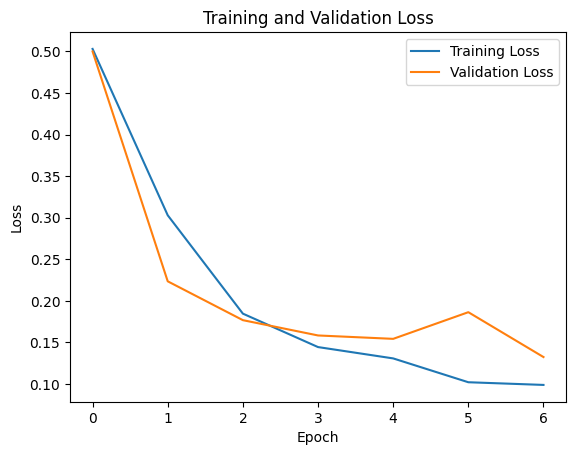

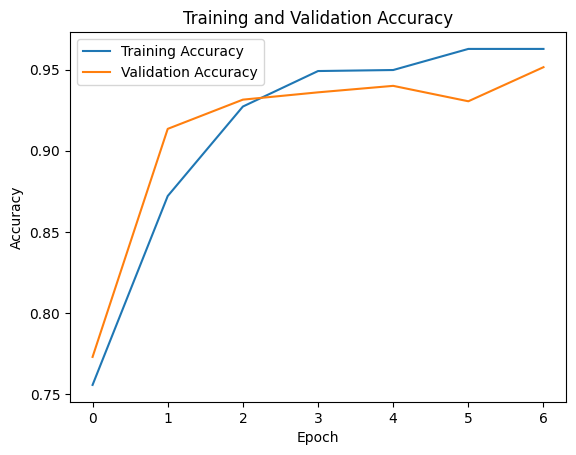

In [ ]:
# Extract the loss and accuracy values from the training history
# These will be used to visualize the model's performance over the epochs
train_loss = history.history['loss']           # Training loss values per epoch
val_loss = history.history['val_loss']         # Validation loss values per epoch
train_acc = history.history['accuracy']        # Training accuracy values per epoch
val_acc = history.history['val_accuracy']      # Validation accuracy values per epoch

# Plot the training and validation loss curves
plt.plot(train_loss, label='Training Loss')    # Training loss curve
plt.plot(val_loss, label='Validation Loss')    # Validation loss curve
plt.title('Training and Validation Loss')     # Title of the plot
plt.xlabel('Epoch')                           # X-axis label
plt.ylabel('Loss')                            # Y-axis label
plt.legend()                                  # Show legend
plt.show()                                    # Display the plot

# Plot the training and validation accuracy curves
plt.plot(train_acc, label='Training Accuracy')    # Training accuracy curve
plt.plot(val_acc, label='Validation Accuracy')    # Validation accuracy curve
plt.title('Training and Validation Accuracy')    # Title of the plot
plt.xlabel('Epoch')                              # X-axis label
plt.ylabel('Accuracy')                           # Y-axis label
plt.legend()                                     # Show legend
plt.show()                                       # Display the plot

In [ ]:
# Assign the final loss values for training and validation
train_loss = 0.0988   # Final training loss obtained after training
val_loss = 0.1323     # Final validation loss obtained after training

# Print the gap between training loss and validation loss
# This gap can indicate overfitting if it's too large
print("valor de gap en loss:", np.abs(train_loss - val_loss))  # Absolute difference

valor de gap en loss: 0.0335


In [ ]:
# Assign the final accuracy values for training and validation
train_accuracy = 0.9628   # Final training accuracy obtained after training
val_accuracy = 0.9515     # Final validation accuracy obtained after training

# Print the gap between training accuracy and validation accuracy
# This gap can indicate overfitting if it's too large
print("valor de gap en accuracy:", np.abs(train_accuracy - val_accuracy))  # Absolute difference

valor de gap en accuracy: 0.011299999999999977


In [ ]:
# Confusion matrix
y_pred_ = modelo.predict(X_test)  # Get the predicted probabilities for each class

# Convert predictions to class labels (index of the highest probability)
y_pred = np.argmax(y_pred_, axis=1)

63/63 [==============================] - 24s 272ms/step


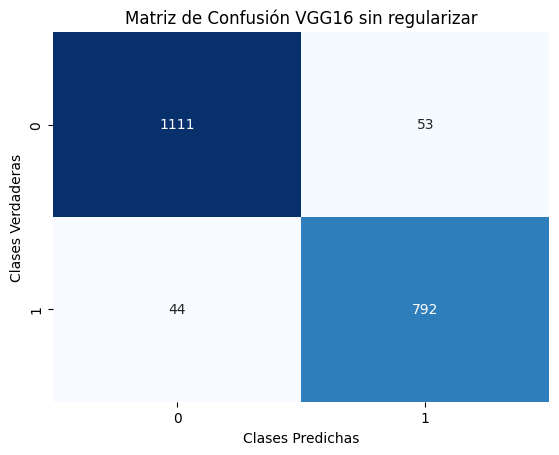

In [ ]:
# Confusion matrix for VGG16 without regularization
cm = confusion_matrix(y_test, y_pred)  # Compute the confusion matrix using true and predicted labels

# Plot the confusion matrix for VGG16 without regularization
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)  # Create a heatmap of the matrix
plt.xlabel('Predicted Classes')   # Label for predicted classes (x-axis)
plt.ylabel('True Classes')        # Label for true classes (y-axis)
plt.title('Confusion Matrix - VGG16 without regularization')  # Title of the plot
plt.show()  # Display the plot

In [ ]:
# Classification report for VGG16 without regularization
report_vgg16_noreg = classification_report(y_test, y_pred, digits=4)  # Generate precision, recall, f1-score, and support

# Print the classification report for VGG16 without regularization
print("Classification report with VGG16 without regularization: \n", report_vgg16_noreg)

Reporte de clasificación con VGG16 sin regularizar: 
               precision    recall  f1-score   support

           0     0.9619    0.9545    0.9582      1164
           1     0.9373    0.9474    0.9423       836

    accuracy                         0.9515      2000
   macro avg     0.9496    0.9509    0.9502      2000
weighted avg     0.9516    0.9515    0.9515      2000



The CNN model based on VGG16, despite being trained without any form of regularization, shows strong performance during the validation stage. With an accuracy of 0.9515, the model demonstrates reliable and consistent classification of the two classes (0 – female, 1 – male).

For class 0, the model achieves a precision of 0.9619, a recall of 0.9545, and an F1-score of 0.9582, supported by approximately 1,164 samples. These strong results for class 0 are likely influenced by its larger number of samples, which provides the model with more representative patterns to learn from. This slight class imbalance, however, does not seem to negatively impact the model’s overall performance.

Moreover, analyzing the training and validation loss curves shows that, even in the absence of regularization, the model does not exhibit significant overfitting. The loss gap of 0.0335 is only slightly above the target threshold of 0.02, indicating a controlled and acceptable level of generalization.

In conclusion, this unregularized VGG16 model performs well according to both loss and accuracy curves as well as the confusion matrix metrics, proving to be a solid baseline architecture before introducing regularization techniques.

In [ ]:
# Define regularization strength (alpha) and dropout rate (tasa)
alpha = 0.00001
tasa = 0.1

# Build a VGG16-like CNN model with L1/L2 regularization and Dropout
modelo1 = Sequential([
    # Input normalization
    Rescaling(scale=1./255, input_shape=(224, 224, 3)),

    # Convolutional Block 1 with L2 regularization
    Conv2D(64, kernel_size=(3, 3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(alpha)),
    Conv2D(64, kernel_size=(3, 3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(alpha)),
    MaxPooling2D(pool_size=(2, 2), strides=(2, 2)),

    # Convolutional Block 2 with L2 regularization
    Conv2D(128, kernel_size=(3, 3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(alpha)),
    Conv2D(128, kernel_size=(3, 3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(alpha)),
    MaxPooling2D(pool_size=(2, 2), strides=(2, 2)),

    # Convolutional Block 3 with mixed L2 and L1 regularization
    Conv2D(256, kernel_size=(3, 3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(alpha)),
    Conv2D(256, kernel_size=(3, 3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(alpha)),
    Conv2D(256, kernel_size=(3, 3), padding='same', activation='relu', kernel_regularizer=regularizers.l1(alpha)),
    MaxPooling2D(pool_size=(2, 2), strides=(2, 2)),

    # Convolutional Block 4 with L2 regularization
    Conv2D(512, kernel_size=(3, 3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(alpha)),
    Conv2D(512, kernel_size=(3, 3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(alpha)),
    Conv2D(512, kernel_size=(3, 3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(alpha)),
    MaxPooling2D(pool_size=(2, 2), strides=(2, 2)),

    # Convolutional Block 5 with L2 regularization
    Conv2D(512, kernel_size=(3, 3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(alpha)),
    Conv2D(512, kernel_size=(3, 3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(alpha)),
    Conv2D(512, kernel_size=(3, 3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(alpha)),
    MaxPooling2D(pool_size=(2, 2), strides=(2, 2)),

    # Flatten layer to convert feature maps into a 1D vector
    Flatten(),

    # Fully connected layer 1 with Dropout for regularization
    Dense(4096, activation='relu'),
    Dropout(tasa),

    # Fully connected layer 2 with Dropout for regularization
    Dense(4096, activation='relu'),
    Dropout(tasa),

    # Output layer with sigmoid activation for binary classification
    Dense(1, activation='sigmoid')
])

# Display the model architecture
modelo1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 224, 224, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 224, 224, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 224, 224, 64)      36928     
                                                                 
 max_pooling2d (MaxPooling2  (None, 112, 112, 64)      0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 112, 112, 128)     73856     
                                                                 
 conv2d_3 (Conv2D)           (None, 112, 112, 128)     147584    
                                                        

In [ ]:
# Compile the model
# - Optimizer: Adam with a learning rate of 1e-4 for stable convergence
# - Loss: Binary Crossentropy, since this is a binary classification problem
# - Metrics: Accuracy to evaluate performance during training and validation
modelo1.compile(optimizer=Adam(learning_rate=1e-4),
                loss=tf.keras.losses.BinaryCrossentropy(),
                metrics=['accuracy'])

In [ ]:
# Train the model
# - Uses the training set (X_train, y_train) to update model weights
# - Runs for 10 epochs with a batch size of 64
# - Validation data (X_test, y_test) is used to monitor performance after each epoch
# - verbose=1 provides detailed progress output during training
history1 = modelo1.fit(
    X_train, y_train,
    epochs=10,
    batch_size=64,
    validation_data=(X_test, y_test),
    verbose=1
)

Epoch 1/10
125/125 [==============================] - 185s 1s/step - loss: 0.7636 - accuracy: 0.6335 - val_loss: 0.6824 - val_accuracy: 0.7005
Epoch 2/10
125/125 [==============================] - 136s 1s/step - loss: 0.5759 - accuracy: 0.7819 - val_loss: 0.5758 - val_accuracy: 0.7580
Epoch 3/10
125/125 [==============================] - 135s 1s/step - loss: 0.5008 - accuracy: 0.8083 - val_loss: 0.4986 - val_accuracy: 0.8050
Epoch 4/10
125/125 [==============================] - 135s 1s/step - loss: 0.4387 - accuracy: 0.8356 - val_loss: 0.4151 - val_accuracy: 0.8460
Epoch 5/10
125/125 [==============================] - 136s 1s/step - loss: 0.3328 - accuracy: 0.8870 - val_loss: 0.2701 - val_accuracy: 0.9180
Epoch 6/10
125/125 [==============================] - 135s 1s/step - loss: 0.2419 - accuracy: 0.9294 - val_loss: 0.2222 - val_accuracy: 0.9440
Epoch 7/10
125/125 [==============================] - 135s 1s/step - loss: 0.2107 - accuracy: 0.9394 - val_loss: 0.2229 - val_accuracy: 0.9375

In [ ]:
# Assign the final loss values for training and validation
train_loss = 0.1613   # Final training loss after training
val_loss = 0.19600    # Final validation loss after training

# Print the gap between training loss and validation loss
# A small gap suggests the model is generalizing well,
# while a large gap may indicate overfitting
print("valor de gap en loss:", np.abs(train_loss - val_loss))  # Absolute difference

valor de gap en loss: 0.03470000000000001


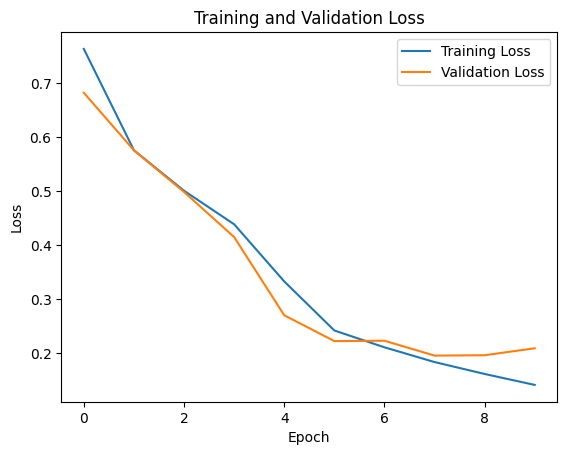

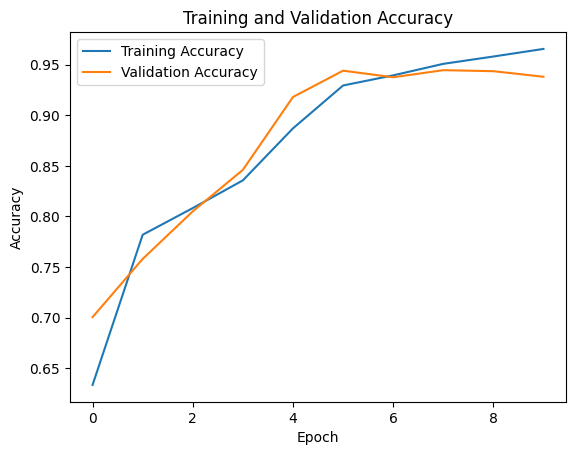

In [ ]:
# Extract training and validation metrics from the training history
train_loss = history1.history['loss']           # Training loss values per epoch
val_loss = history1.history['val_loss']         # Validation loss values per epoch
train_acc = history1.history['accuracy']        # Training accuracy values per epoch
val_acc = history1.history['val_accuracy']      # Validation accuracy values per epoch

# Plot training vs. validation loss over epochs
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot training vs. validation accuracy over epochs
plt.plot(train_acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
# Generate predicted probabilities for the test set using the trained model
y_pred_proba = modelo1.predict(X_test)

# Convert the continuous probabilities into binary class predictions
# If the probability is greater or equal to 0.5 → class 1, otherwise → class 0
threshold = 0.5
y_pred = (y_pred_proba >= threshold).astype(int)

63/63 [==============================] - 15s 131ms/step


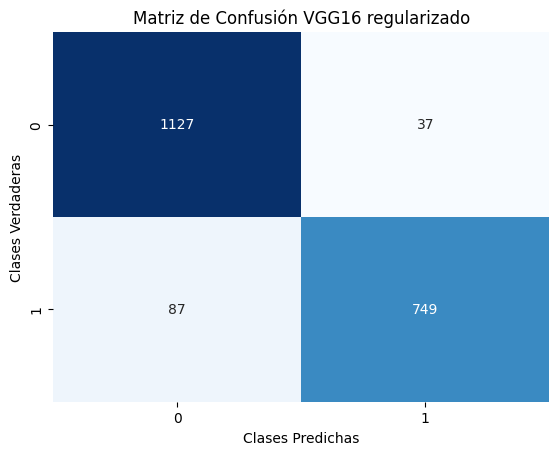

In [ ]:
# Compute the confusion matrix to evaluate classification performance
cm1 = confusion_matrix(y_test, y_pred)

# Visualize the confusion matrix using a heatmap
# This shows the number of correct and incorrect predictions for each class
sns.heatmap(cm1, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted Classes')
plt.ylabel('True Classes')
plt.title('Confusion Matrix - VGG16 with Regularization')
plt.show()

In [ ]:
# Generate a detailed classification report for the regularized VGG16 model
# This includes precision, recall, f1-score, and support for each class
report_vgg16_reg = classification_report(y_test, y_pred, digits=4)

# Display the classification report
print("Classification Report - VGG16 with Regularization:\n", report_vgg16_reg)

Reporte de clasificación con VGG16 regularizado: 
               precision    recall  f1-score   support

           0     0.9283    0.9682    0.9479      1164
           1     0.9529    0.8959    0.9236       836

    accuracy                         0.9380      2000
   macro avg     0.9406    0.9321    0.9357      2000
weighted avg     0.9386    0.9380    0.9377      2000



### VGG16 Transfer Learning Training and Validation

In [ ]:
# Load the pre-trained VGG16 model as the base (feature extractor)
# - include_top=False: excludes the fully connected layers at the top
# - weights='imagenet': loads weights pre-trained on the ImageNet dataset
# - input_tensor: sets the input shape for the model
modelo_base = keras.applications.VGG16(
    include_top=False,
    weights='imagenet',
    input_tensor=LK.Input(shape=(224, 224, 3))
)

58889256/58889256 [==============================] - 3s 0us/step


In [ ]:
# Get the output of the base model
input = modelo_base.output

# Flatten layer to convert the feature maps into a 1D vector
flat = LK.Flatten()(input)

# First fully connected (dense) layer with 120 neurons and ReLU activation
fc1 = LK.Dense(120, activation='relu')(flat)

# Second fully connected (dense) layer with 84 neurons and ReLU activation
fc2 = LK.Dense(84, activation='relu')(fc1)

# Output layer with 2 neurons (for 2 classes) and softmax activation
# Softmax gives class probabilities for multi-class classification
output = LK.Dense(2, activation='softmax')(fc2)

# Create the final model linking the base input with the new output layers
modelo = MK.Model(inputs=modelo_base.input, outputs=output)

# Display the model architecture
modelo.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
# By setting this to True, all layers in the base model
# (VGG16 in this case) will be marked as trainable,
# allowing their weights to be updated during training.
modelo_base.trainable = True

In [ ]:
# - Optimizer: Adam (adaptive learning rate optimization)
# - Loss: Sparse categorical crossentropy (used for integer labels with multiple classes)
# - Metrics: Accuracy (to monitor performance during training and validation)
modelo.compile(
    optimizer='adam',
    loss="sparse_categorical_crossentropy",
    metrics=['accuracy']
)

In [ ]:
# Train the model using the training data (X_train, y_train)
# epochs=7 → the model will go through the entire training data 7 times
# batch_size=64 → the data will be processed in mini-batches of 64 samples
# validation_data=(X_test, y_test) → evaluate the model on test data after each epoch
# verbose=1 → show training progress during fitting
history_transfer = modelo.fit(X_train, y_train, epochs=7, batch_size=64,
                              validation_data=(X_test, y_test), verbose=1)

Epoch 1/7
125/125 [==============================] - 163s 957ms/step - loss: 10.4150 - accuracy: 0.5819 - val_loss: 0.6303 - val_accuracy: 0.6760
Epoch 2/7
125/125 [==============================] - 107s 856ms/step - loss: 0.4948 - accuracy: 0.7663 - val_loss: 0.4334 - val_accuracy: 0.8130
Epoch 3/7
125/125 [==============================] - 107s 854ms/step - loss: 0.3560 - accuracy: 0.8468 - val_loss: 0.4813 - val_accuracy: 0.7910
Epoch 4/7
125/125 [==============================] - 107s 853ms/step - loss: 0.2986 - accuracy: 0.8759 - val_loss: 0.3001 - val_accuracy: 0.8775
Epoch 5/7
125/125 [==============================] - 107s 854ms/step - loss: 0.2338 - accuracy: 0.9053 - val_loss: 0.2225 - val_accuracy: 0.9175
Epoch 6/7
125/125 [==============================] - 107s 854ms/step - loss: 0.1977 - accuracy: 0.9205 - val_loss: 0.3155 - val_accuracy: 0.8705
Epoch 7/7
125/125 [==============================] - 107s 855ms/step - loss: 0.1673 - accuracy: 0.9345 - val_loss: 0.2038 - val_a

In [ ]:
# Store the training loss value
train_loss = 0.1673

# Store the validation loss value
val_loss = 0.2038

# Print the absolute difference (gap) between training and validation loss
# This helps to check if the model is overfitting or underfitting
print("valor de gap en loss:", np.abs(train_loss - val_loss))

valor de gap en loss: 0.036500000000000005


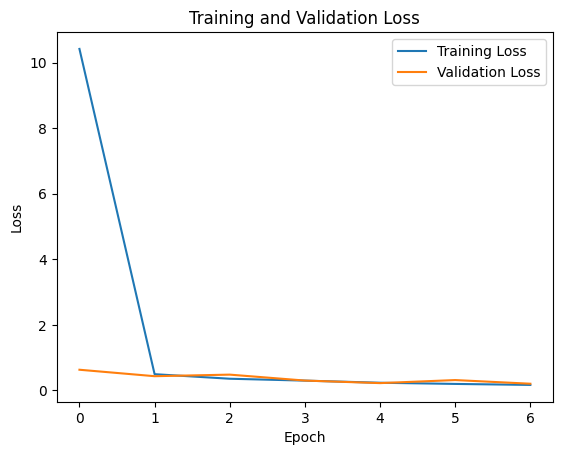

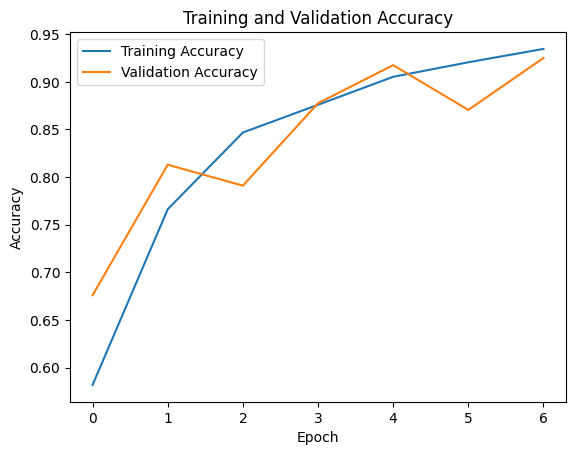

In [ ]:
# Plotting training and validation loss and accuracy

# Extract training loss values from the training history
train_loss = history_transfer.history['loss']

# Extract validation loss values from the training history
val_loss = history_transfer.history['val_loss']

# Extract training accuracy values from the training history
train_acc = history_transfer.history['accuracy']

# Extract validation accuracy values from the training history
val_acc = history_transfer.history['val_accuracy']

# ---------------- Plot Loss ----------------
plt.plot(train_loss, label='Training Loss')      # Plot training loss curve
plt.plot(val_loss, label='Validation Loss')      # Plot validation loss curve
plt.title('Training and Validation Loss')        # Add title to the plot
plt.xlabel('Epoch')                              # Label for X-axis (epoch number)
plt.ylabel('Loss')                               # Label for Y-axis (loss value)
plt.legend()                                     # Show legend to identify curves
plt.show()                                       # Display the loss plot

# ---------------- Plot Accuracy ----------------
plt.plot(train_acc, label='Training Accuracy')   # Plot training accuracy curve
plt.plot(val_acc, label='Validation Accuracy')   # Plot validation accuracy curve
plt.title('Training and Validation Accuracy')    # Add title to the plot
plt.xlabel('Epoch')                              # Label for X-axis (epoch number)
plt.ylabel('Accuracy')                           # Label for Y-axis (accuracy value)
plt.legend()                                     # Show legend to identify curves
plt.show()                                       # Display the accuracy plot

In [ ]:
# Confusion matrix

# Generate predictions for the test set using the trained model
y_pred_1 = modelo.predict(X_test)

# Convert the prediction probabilities into class labels
# np.argmax selects the index of the highest probability for each sample
y_pred = np.argmax(y_pred_1, axis=1)

63/63 [==============================] - 14s 117ms/step


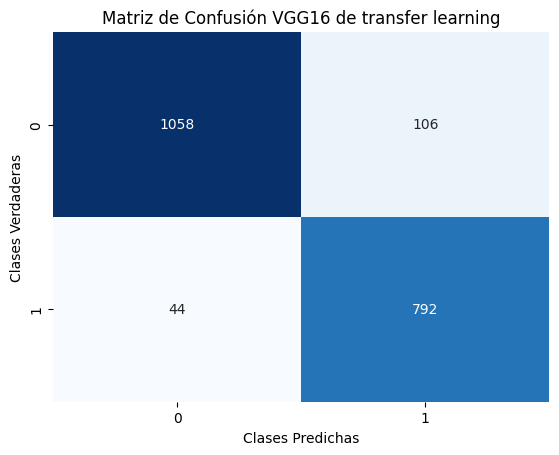

In [ ]:
# Confusion matrix for VGG16 transfer learning

# Create the confusion matrix comparing true labels (y_test) and predicted labels (y_pred)
cm = confusion_matrix(y_test, y_pred)

# Visualize the confusion matrix as a heatmap
# annot=True → show the values inside each cell
# fmt='d' → format the numbers as integers
# cmap='Blues' → use a blue color map for better visualization
# cbar=False → remove the color bar on the side
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)

# Label the axes and add a title
plt.xlabel('Predicted Classes')          # X-axis shows the predicted class labels
plt.ylabel('True Classes')               # Y-axis shows the true class labels
plt.title('Confusion Matrix VGG16 Transfer Learning')  # Title of the plot

# Display the plot
plt.show()

In [ ]:
# Classification report for VGG16 transfer learning

# Generate a classification report showing precision, recall, f1-score, and support
# digits=4 → format the output values with 4 decimal places
report_vgg16_noreg = classification_report(y_test, y_pred, digits=4)

# Print the classification report
print("Reporte de clasificación con VGG16 de transfer learning: \n", report_vgg16_noreg)

Reporte de clasificación con VGG16 de transfer learning: 
               precision    recall  f1-score   support

           0     0.9601    0.9089    0.9338      1164
           1     0.8820    0.9474    0.9135       836

    accuracy                         0.9250      2000
   macro avg     0.9210    0.9282    0.9236      2000
weighted avg     0.9274    0.9250    0.9253      2000



The first implemented model, a convolutional neural network (CNN) with L2 regularization and dropout applied to the dense layers, demonstrates strong performance. This is evident from the training and validation loss and accuracy curves, as well as the confusion matrix and its classification report.

The model achieves a validation accuracy of 0.9380, which is slightly lower than the non-regularized version — indicating that regularization likely helped prevent overfitting. Most evaluation metrics favor class 0, with a recall of 0.9682 and an F1-score of 0.9479, while class 1 shows a higher precision of 0.9529.

The loss and accuracy curves show no signs of overfitting, although the loss gap is 0.03, slightly above the desired threshold of 0.02. This suggests that additional training epochs might lead to a better alignment between training and validation metrics. Nonetheless, the results confirm that this is an effective and well-performing model for the given validation data.

The transfer learning model yields even better results in terms of metrics derived from the confusion matrix and the training and validation curves. However, its loss gap also remains at 0.03, indicating that more epochs may be required to achieve a tighter fit.

Interestingly, the validation accuracy for the transfer learning model is 0.9250, which is slightly lower than the CNN with L2 regularization. This further supports the observation that the model is not overfitting and maintains better generalization properties.

In conclusion, although the transfer learning model shows a slightly lower validation accuracy, it is likely to generalize better to external datasets that were not part of the training or validation process. This makes it a strong candidate for real-world prediction tasks.

### CNN in detail

In [ ]:
# Loop through each layer in the model
for layer in modelo1.layers:
    # Check if the layer is a convolutional layer
    # If the layer's name does not contain 'conv', skip it
    if 'conv' not in layer.name:
        continue

    # Print the name of the convolutional layer found
    print(f"Found convolutional layer: {layer.name}")

    # Freeze the convolutional layer (make it non-trainable)
    # This prevents updating its weights during training
    layer.trainable = False

Found convolutional layer: conv2d_13
Found convolutional layer: conv2d_14
Found convolutional layer: conv2d_15
Found convolutional layer: conv2d_16
Found convolutional layer: conv2d_17
Found convolutional layer: conv2d_18
Found convolutional layer: conv2d_19
Found convolutional layer: conv2d_20
Found convolutional layer: conv2d_21
Found convolutional layer: conv2d_22
Found convolutional layer: conv2d_23
Found convolutional layer: conv2d_24
Found convolutional layer: conv2d_25


In [ ]:
# Extract the weights and biases of the current layer
filters, biases = layer.get_weights()

# Print the layer name and the shape of its filters
# filters.shape shows the dimensions of the convolutional kernels
print(layer.name, filters.shape)

dense_5 (4096, 1)


In [ ]:
# Loop through each layer in the model
for layer in modelo1.layers:
    # Check if the layer is a convolutional layer
    if 'conv' not in layer.name:
        continue  # Skip to the next iteration if it's not a convolutional layer

    # Get the filter weights and biases of the current layer
    filters, biases = layer.get_weights()

    # Print the layer name and the shape of the filters
    print(layer.name, filters.shape)

conv2d_13 (3, 3, 3, 64)
conv2d_14 (3, 3, 64, 64)
conv2d_15 (3, 3, 64, 128)
conv2d_16 (3, 3, 128, 128)
conv2d_17 (3, 3, 128, 256)
conv2d_18 (3, 3, 256, 256)
conv2d_19 (3, 3, 256, 256)
conv2d_20 (3, 3, 256, 512)
conv2d_21 (3, 3, 512, 512)
conv2d_22 (3, 3, 512, 512)
conv2d_23 (3, 3, 512, 512)
conv2d_24 (3, 3, 512, 512)
conv2d_25 (3, 3, 512, 512)


In [ ]:
# Get the filter weights and biases from the second layer of the model
# (Index 1 because layer indexing starts at 0)
filters, biases = modelo1.layers[1].get_weights()

In [ ]:
# Normalize filter values to the range 0–1 for visualization purposes

# Get the minimum and maximum values of the filters
f_min, f_max = filters.min(), filters.max()

# Normalize the filters so that all values fall between 0 and 1
# This makes it easier to display them as images
filters = (filters - f_min) / (f_max - f_min)

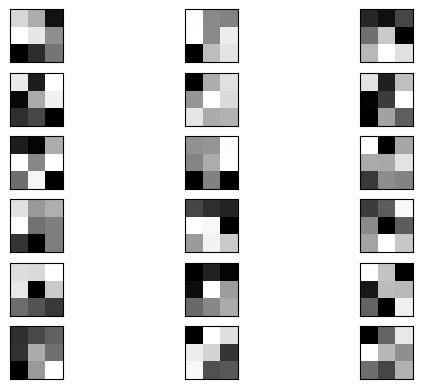

In [ ]:
# Plot the first few filters of the convolutional layer

# Number of filters to display and subplot index counter
n_filters, ix = 6, 1

# Loop through the first n_filters
for i in range(n_filters):
    # Get the i-th filter (shape: height x width x channels)
    f = filters[:, :, :, i]

    # Plot each channel of the filter separately (e.g., RGB → 3 channels)
    for j in range(3):
        # Define the subplot position and remove axis ticks
        ax = plt.subplot(n_filters, 3, ix)
        ax.set_xticks([])
        ax.set_yticks([])

        # Display the filter channel in grayscale
        plt.imshow(f[:, :, j], cmap='gray')
        ix += 1

# Show the final figure with all filter visualizations
plt.show()

This image shows the first six filters out of the 64 filters in the first convolutional layer of the network.

In [ ]:
# Loop through all layers in the model
for i in range(len(modelo1.layers)):
    layer = modelo1.layers[i]

    # Check if the layer is a convolutional layer
    if 'conv' not in layer.name:
        continue  # Skip to the next layer if it's not convolutional

    # Print the layer index, name, and its output shape
    # This helps to understand how the feature map dimensions change across layers
    print(i, layer.name, layer.output.shape)

1 conv2d_13 (None, 224, 224, 64)
2 conv2d_14 (None, 224, 224, 64)
4 conv2d_15 (None, 112, 112, 128)
5 conv2d_16 (None, 112, 112, 128)
7 conv2d_17 (None, 56, 56, 256)
8 conv2d_18 (None, 56, 56, 256)
9 conv2d_19 (None, 56, 56, 256)
11 conv2d_20 (None, 28, 28, 512)
12 conv2d_21 (None, 28, 28, 512)
13 conv2d_22 (None, 28, 28, 512)
15 conv2d_23 (None, 14, 14, 512)
16 conv2d_24 (None, 14, 14, 512)
17 conv2d_25 (None, 14, 14, 512)


In [ ]:
# Create a new model that uses the same inputs as 'modelo1'
# but outputs the activations of the second layer (index 1)
# This is useful for visualizing feature maps or extracting intermediate representations
model = Model(inputs=modelo1.inputs, outputs=modelo1.layers[1].output)

In [ ]:
# Select one image from the test set (in this case, the third image)
img_array = X_test[2]

# Expand dimensions to represent a single sample (batch size of 1)
# This is required because the model expects a batch as input
img_array = np.expand_dims(img_array, axis=0)

# Preprocess the image (e.g., scale pixel values according to VGG16 requirements)
img_array = preprocess_input(img_array)

# Generate the feature maps for the first hidden layer
# This passes the image through the model up to the selected layer
feature_maps = model.predict(img_array)

1/1 [==============================] - 0s 51ms/step


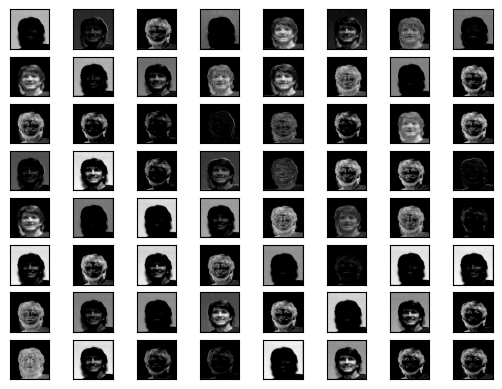

In [ ]:
# Plot all 64 feature maps in an 8x8 grid

# Define the grid size (8x8 = 64 maps)
square = 8
ix = 1  # Index counter for subplots

# Loop through the grid rows and columns
for _ in range(square):
    for _ in range(square):
        # Define the subplot position and remove axis ticks
        ax = plt.subplot(square, square, ix)
        ax.set_xticks([])
        ax.set_yticks([])

        # Display the feature map in grayscale
        # feature_maps[0, :, :, ix-1] corresponds to the (ix-1)-th filter activation
        plt.imshow(feature_maps[0, :, :, ix-1], cmap='gray')
        ix += 1

# Show the final visualization with all 64 feature maps
plt.show()

This image shows the feature maps extracted from the first convolutional layer of the regularized network.

In [ ]:
# Redefine the model to output activations from multiple intermediate layers
# 'ixs' contains the indexes of the layers we want to visualize
ixs = [2, 5, 9, 13, 17]

# Collect the outputs of the selected layers
outputs = [modelo1.layers[i].output for i in ixs]

# Create a new model with the same inputs as 'modelo1'
# but with multiple outputs corresponding to the selected layers
model = Model(inputs=modelo1.inputs, outputs=outputs)

In [ ]:
# Select one image from the test set (in this case, the first image)
img_array = X_test[0]

# Expand dimensions to represent a single sample (batch size of 1)
# This is required because the model expects a batch as input
img_array = np.expand_dims(img_array, axis=0)

# Preprocess the image (e.g., scale pixel values according to VGG16 requirements)
img_array = preprocess_input(img_array)

# Generate the feature maps for the selected intermediate layers
# The model will output a list of feature maps, one for each chosen layer
feature_maps = model.predict(img_array)

1/1 [==============================] - 2s 2s/step


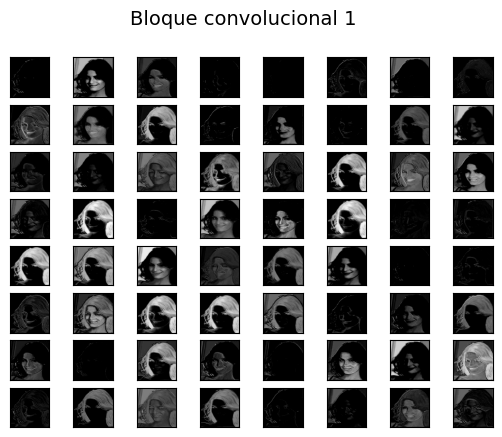

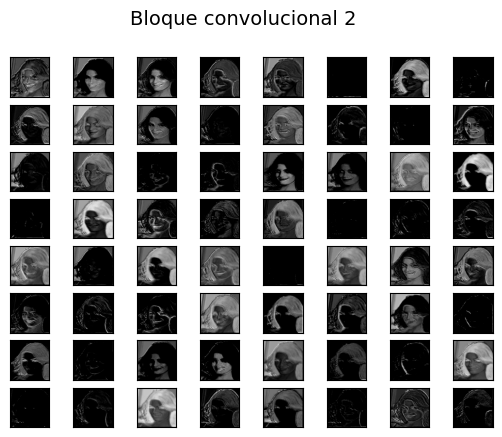

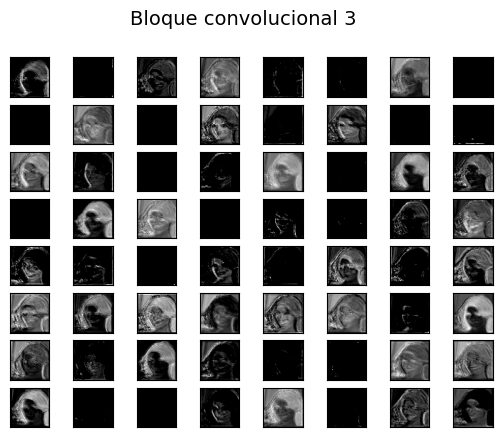

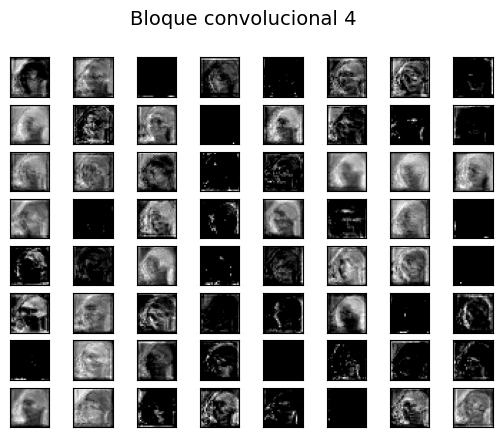

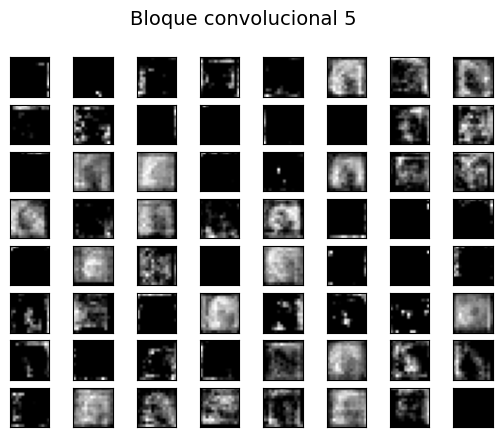

In [ ]:
# Plot the feature maps output from each selected convolutional block

square = 8  # Define the grid size (8x8 = 64 feature maps)

# Loop through each set of feature maps from the selected layers
for i, fmap in enumerate(feature_maps, 1):
    # Plot all 64 maps for the current block
    ix = 1
    for _ in range(square):
        for _ in range(square):
            # Define the subplot position and remove axis ticks
            ax = plt.subplot(square, square, ix)
            ax.set_xticks([])
            ax.set_yticks([])

            # Display the feature map in grayscale
            plt.imshow(fmap[0, :, :, ix-1], cmap='gray')
            ix += 1

    # Add a title indicating the current convolutional block
    plt.suptitle(f'Convolutional Block {i}', fontsize=14)

    # Show the figure
    plt.show()

Visualizing the layers of our convolutional neural networks can be very insightful, as it allows us to observe what happens inside the CNN. Through these visualizations, we can clearly see the different convolutions performed by the previously shown filters, which are responsible for extracting the features used to classify images of men and women.

We can notice that the features extracted from the early convolutional blocks differ significantly from those extracted in the deeper layers. As the image passes through each filter, it becomes smaller and loses dimensionality, which may seem like a loss of quality. However, this transformation allows the model to capture and interpret the most relevant spatial information, enabling more accurate classification.

### Visualizing the groups of people

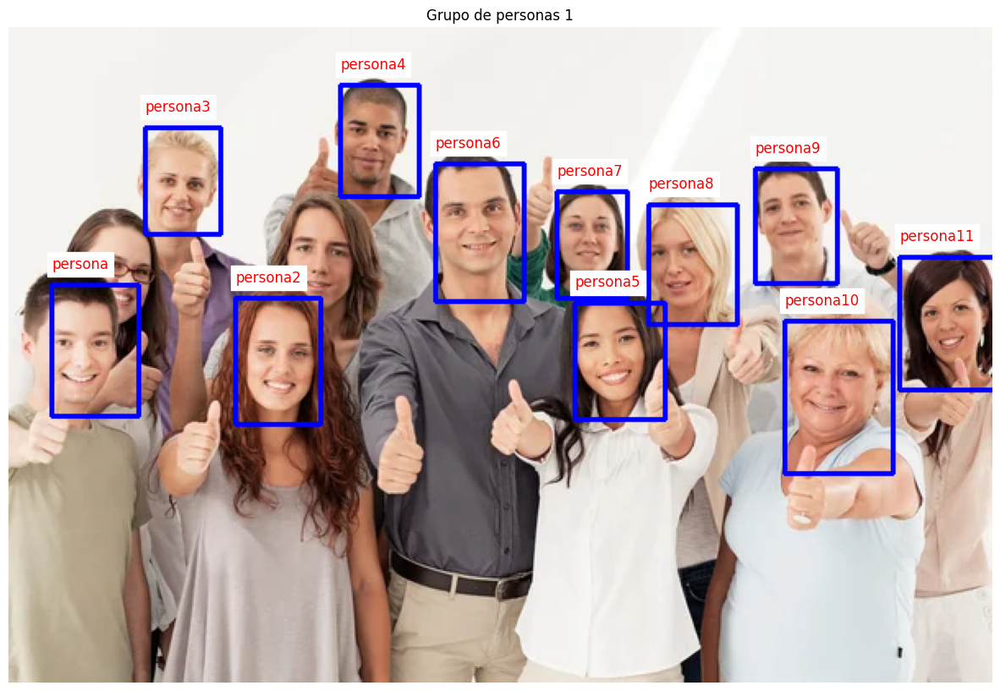

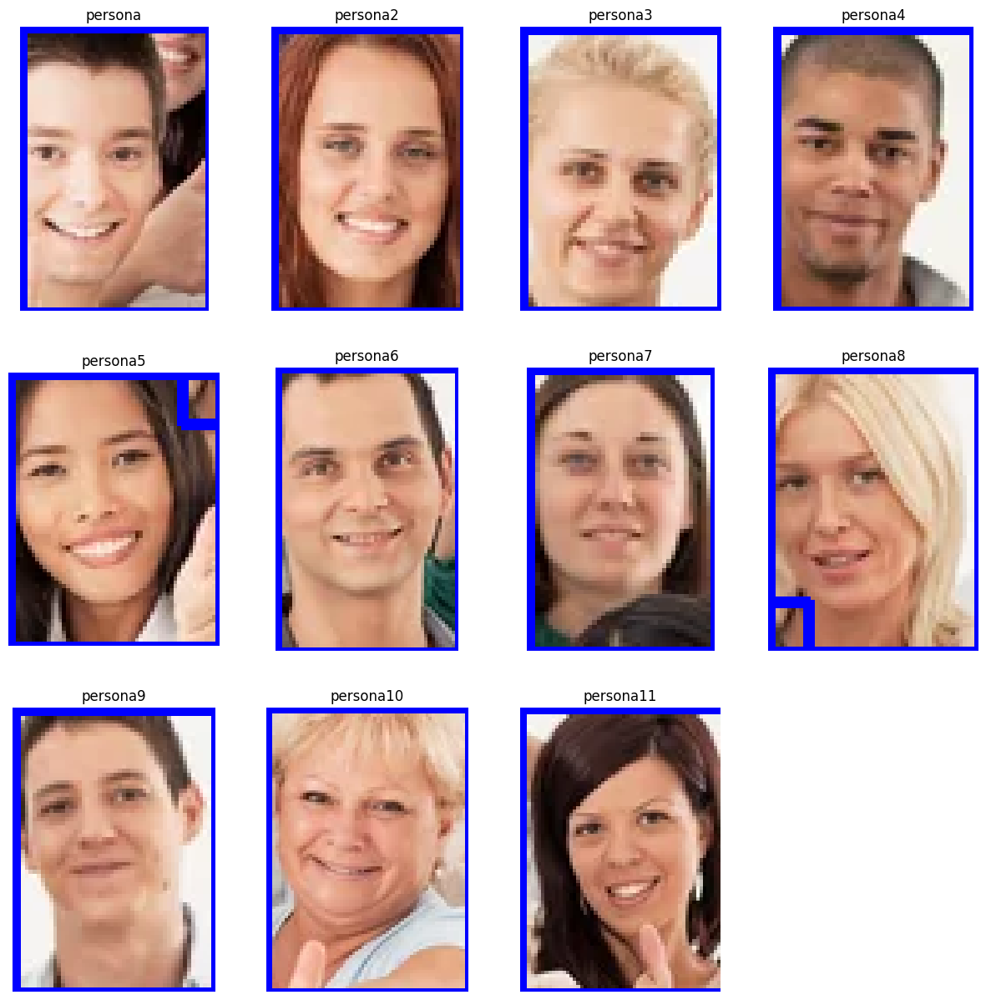

Forma de grupo1: (11, 224, 224, 3)


In [ ]:
# Create an empty list to store the cropped faces for group 1
grupo1 = []

# Provided information with bounding box coordinates and image details
data = {
    "boxes": [
        {"label": "persona", "x": "26.81", "y": "157.33", "width": "53.62", "height": "80.23"},
        {"label": "persona2", "x": "138.11", "y": "165.25", "width": "52.33", "height": "77.32"},
        {"label": "persona3", "x": "83.30", "y": "61.12", "width": "46.93", "height": "65.16"},
        {"label": "persona4", "x": "202.69", "y": "35.56", "width": "48.98", "height": "68.90"},
        {"label": "persona5", "x": "345.13", "y": "168.50", "width": "55.59", "height": "71.90"},
        {"label": "persona6", "x": "260.19", "y": "83.21", "width": "54.78", "height": "84.35"},
        {"label": "persona7", "x": "334.95", "y": "100.60", "width": "43.10", "height": "65.18"},
        {"label": "persona8", "x": "390.70", "y": "108.70", "width": "54.74", "height": "73.53"},
        {"label": "persona9", "x": "455.14", "y": "86.96", "width": "50.14", "height": "70.18"},
        {"label": "persona10", "x": "473.96", "y": "179.27", "width": "66.37", "height": "93.16"},
        {"label": "persona11", "x": "543.30", "y": "140.30", "width": "58.33", "height": "81.05"}
    ],
    "height": 400,
    "key": "depositphotos_25293855-stock-photo-multi-ethnic-group-thumbs-up.jpg",
    "width": 600
}

# Load the image
image_path = data["key"]
image = cv2.imread(image_path)
if image is None:
    print(f"Error loading {image_path}")
else:
    # Convert bounding box coordinates to integers
    bboxes = data["boxes"]

    # Plot the original image with bounding boxes
    plt.figure(figsize=(15, 15))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Group of People 1')

    for bbox in bboxes:
        x = int(float(bbox["x"]))
        y = int(float(bbox["y"]))
        width = int(float(bbox["width"]))
        height = int(float(bbox["height"]))

        # Draw the bounding box on the image
        cv2.rectangle(image, (x, y), (x + width, y + height), (255, 0, 0), 2)
        plt.text(x, y - 10, bbox["label"], color='red', fontsize=12, backgroundcolor='white')

    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

    # Crop and plot each detected face separately
    plt.figure(figsize=(15, 15))
    for i, bbox in enumerate(bboxes):
        x = int(float(bbox["x"]))
        y = int(float(bbox["y"]))
        width = int(float(bbox["width"]))
        height = int(float(bbox["height"]))

        # Extract the face from the image using the bounding box
        face = image[y:y+height, x:x+width]

        # Resize the cropped face to 224x224 for later processing (e.g., CNN input)
        face_resized = cv2.resize(face, (224, 224))

        # Store the processed face in the list
        grupo1.append(face_resized)

        # Display the cropped face
        plt.subplot(3, 4, i + 1)  # Adjust according to the number of faces
        plt.imshow(cv2.cvtColor(face, cv2.COLOR_BGR2RGB))
        plt.title(f'{bbox["label"]}')
        plt.axis('off')

    plt.show()

# Convert the list of faces to a NumPy array
grupo1 = np.array(grupo1)

# Print the shape of the resulting array to verify the data
print("Shape of grupo1:", grupo1.shape)

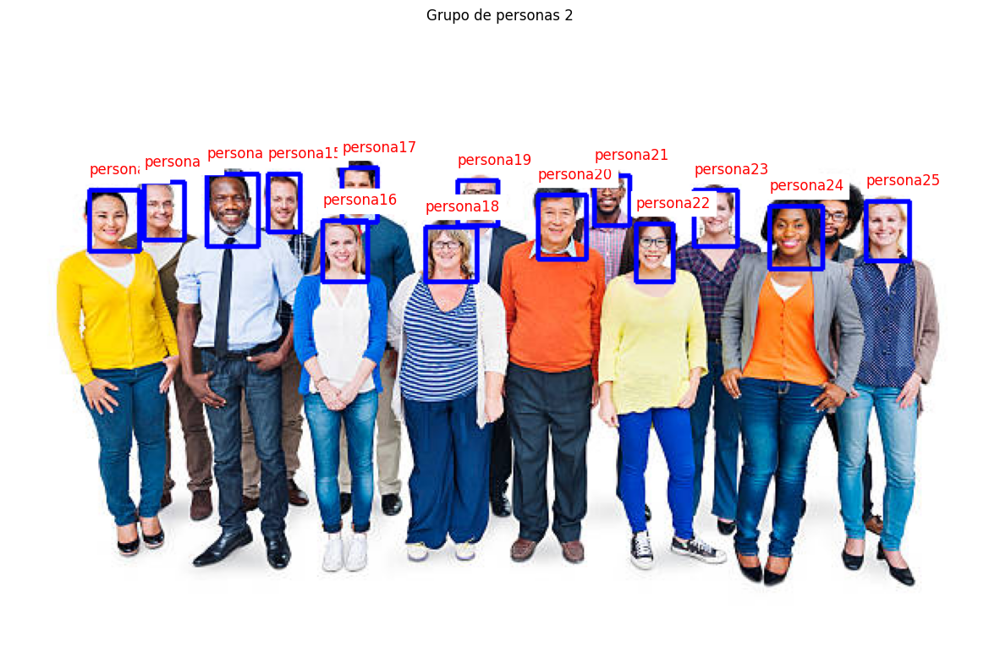

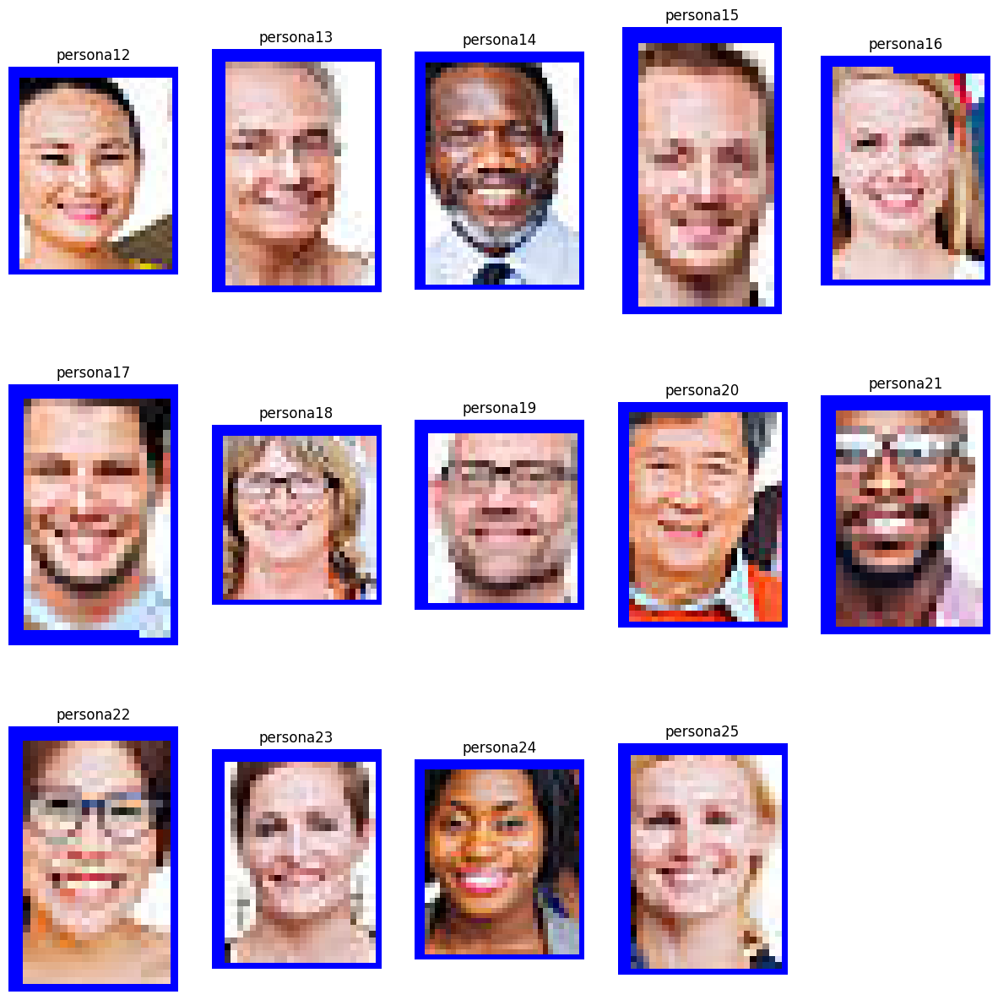

Forma de grupo2: (14, 224, 224, 3)


In [ ]:
# Initialize an empty list to store cropped and resized faces from the second group
grupo2 = []

# Provided bounding box information and image details
data = {
    "boxes": [
        {"label": "persona12", "x": "50.17", "y": "101.44", "width": "31.35", "height": "38.52"},
        {"label": "persona13", "x": "84.05", "y": "96.14", "width": "25.70", "height": "36.22"},
        {"label": "persona14", "x": "123.27", "y": "91.20", "width": "32.03", "height": "45.93"},
        {"label": "persona15", "x": "161.35", "y": "91.13", "width": "20.91", "height": "36.40"},
        {"label": "persona16", "x": "195.59", "y": "120.72", "width": "28.30", "height": "38.71"},
        {"label": "persona17", "x": "207.67", "y": "87.30", "width": "22.83", "height": "34.45"},
        {"label": "persona18", "x": "259.96", "y": "124.41", "width": "32.16", "height": "34.12"},
        {"label": "persona19", "x": "279.76", "y": "95.06", "width": "25.98", "height": "28.63"},
        {"label": "persona20", "x": "329.28", "y": "104.33", "width": "30.79", "height": "40.99"},
        {"label": "persona21", "x": "364.29", "y": "92.03", "width": "22.48", "height": "31.81"},
        {"label": "persona22", "x": "390.93", "y": "122.24", "width": "23.74", "height": "36.29"},
        {"label": "persona23", "x": "426.62", "y": "101.22", "width": "27.57", "height": "35.70"},
        {"label": "persona24", "x": "473.62", "y": "111.71", "width": "33.73", "height": "39.58"},
        {"label": "persona25", "x": "533.17", "y": "108.22", "width": "27.00", "height": "37.47"}
    ],
    "height": 391,
    "key": "istockphoto-484348057-612x612.jpg",
    "width": 612
}

# Load the image from the file path
image_path = data["key"]
image = cv2.imread(image_path)

# Check if the image was successfully loaded
if image is None:
    print(f"Error loading image: {image_path}")
else:
    # Extract the bounding boxes information
    bboxes = data["boxes"]

    # Plot the original image with bounding boxes
    plt.figure(figsize=(15, 15))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Group of People 2')

    # Loop through each bounding box and draw it on the image
    for bbox in bboxes:
        x = int(float(bbox["x"]))
        y = int(float(bbox["y"]))
        width = int(float(bbox["width"]))
        height = int(float(bbox["height"]))

        # Draw a rectangle around the detected person
        cv2.rectangle(image, (x, y), (x + width, y + height), (255, 0, 0), 2)

        # Add a label on top of the bounding box
        plt.text(x, y - 10, bbox["label"], color='red', fontsize=12, backgroundcolor='white')

    # Show the image with all bounding boxes drawn
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

    # Crop and display each detected face individually
    plt.figure(figsize=(15, 15))
    for i, bbox in enumerate(bboxes):
        x = int(float(bbox["x"]))
        y = int(float(bbox["y"]))
        width = int(float(bbox["width"]))
        height = int(float(bbox["height"]))

        # Crop the face from the original image using the bounding box
        face = image[y:y+height, x:x+width]

        # Resize the cropped face to 224x224 pixels (model input size)
        face_resized = cv2.resize(face, (224, 224))

        # Append the resized face to grupo2
        grupo2.append(face_resized)

        # Display the cropped face in a subplot
        plt.subplot(3, 5, i + 1)  # Adjust grid based on number of faces
        plt.imshow(cv2.cvtColor(face, cv2.COLOR_BGR2RGB))
        plt.title(f'{bbox["label"]}')
        plt.axis('off')

    plt.show()

# Convert grupo2 list into a NumPy array for further processing (e.g., prediction)
grupo2 = np.array(grupo2)

# Print the shape of the array to verify dimensions
print("Shape of grupo2:", grupo2.shape)

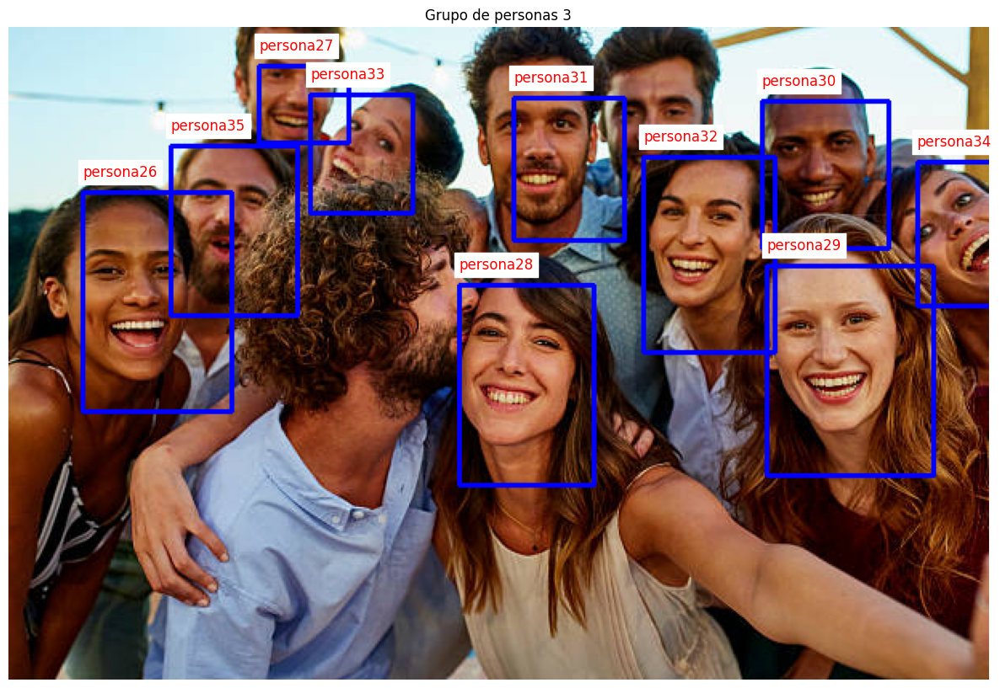

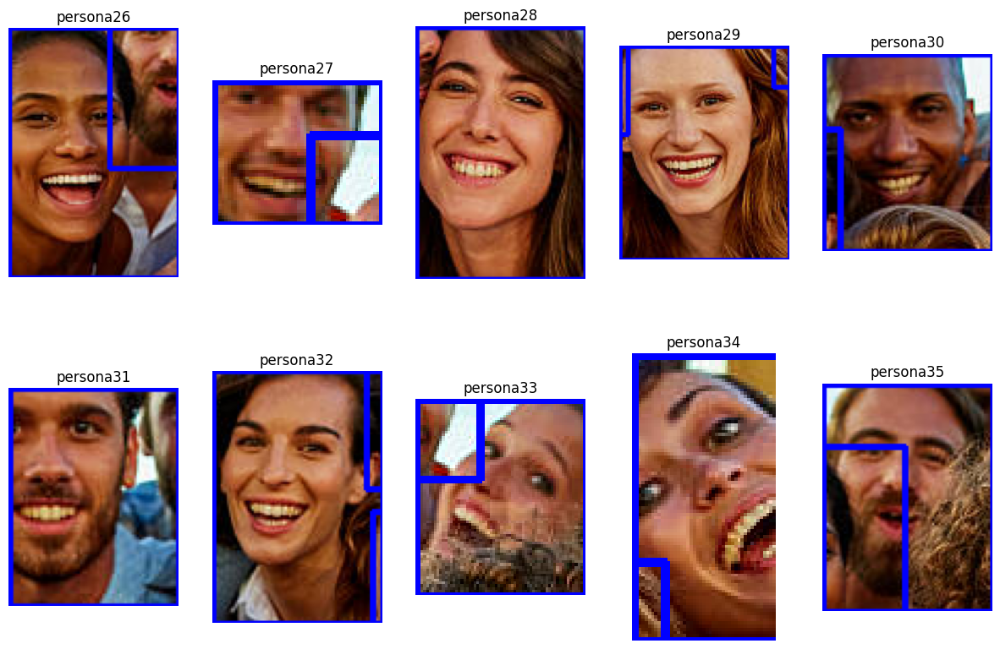

Forma de grupo3: (10, 224, 224, 3)


In [ ]:
# Initialize an empty list to store cropped and resized faces from the third group
grupo3 = []

# Provided bounding box information and image details
data = {
    "boxes": [
        {"label": "persona26", "x": "46.71", "y": "103.05", "width": "93.42", "height": "137.93"},
        {"label": "persona27", "x": "156.17", "y": "24.06", "width": "56.85", "height": "48.11"},
        {"label": "persona28", "x": "281.01", "y": "161.92", "width": "84.06", "height": "125.14"},
        {"label": "persona29", "x": "473.00", "y": "149.87", "width": "104.49", "height": "131.58"},
        {"label": "persona30", "x": "470.87", "y": "46.38", "width": "79.97", "height": "92.77"},
        {"label": "persona31", "x": "315.14", "y": "44.73", "width": "69.07", "height": "89.45"},
        {"label": "persona32", "x": "396.87", "y": "81.01", "width": "82.50", "height": "122.04"},
        {"label": "persona33", "x": "188.92", "y": "42.28", "width": "64.31", "height": "74.32"},
        {"label": "persona34", "x": "567.21", "y": "84.02", "width": "59.16", "height": "90.62"},
        {"label": "persona35", "x": "101.64", "y": "74.49", "width": "79.19", "height": "106.85"}
    ],
    "height": 408,
    "key": "istockphoto-605559123-612x612.jpg",
    "width": 612
}

# Load the image from the file path
image_path = data["key"]
image = cv2.imread(image_path)

# Check if the image was successfully loaded
if image is None:
    print(f"Error loading image: {image_path}")
else:
    # Extract the bounding boxes information
    bboxes = data["boxes"]

    # Plot the original image with bounding boxes
    plt.figure(figsize=(15, 15))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Group of People 3')

    # Draw each bounding box on the image
    for bbox in bboxes:
        x = int(float(bbox["x"]))
        y = int(float(bbox["y"]))
        width = int(float(bbox["width"]))
        height = int(float(bbox["height"]))

        # Draw a rectangle around the detected person
        cv2.rectangle(image, (x, y), (x + width, y + height), (255, 0, 0), 2)

        # Add the person's label above the box
        plt.text(x, y - 10, bbox["label"], color='red', fontsize=12, backgroundcolor='white')

    # Display the image with bounding boxes
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

    # Crop and display each detected face individually
    plt.figure(figsize=(15, 15))
    for i, bbox in enumerate(bboxes):
        x = int(float(bbox["x"]))
        y = int(float(bbox["y"]))
        width = int(float(bbox["width"]))
        height = int(float(bbox["height"]))

        # Crop the face using the bounding box coordinates
        face = image[y:y+height, x:x+width]

        # Resize the cropped face to 224x224 pixels (standard CNN input size)
        face_resized = cv2.resize(face, (224, 224))

        # Append the resized face to grupo3
        grupo3.append(face_resized)

        # Display the cropped face in a subplot
        plt.subplot(2, 5, i + 1)  # 2 rows, 5 columns for 10 faces
        plt.imshow(cv2.cvtColor(face, cv2.COLOR_BGR2RGB))
        plt.title(f'{bbox["label"]}')
        plt.axis('off')

    plt.show()

# Convert grupo3 list into a NumPy array for further processing (e.g., model input)
grupo3 = np.array(grupo3)

# Print the shape of the array to verify dimensions
print("Shape of grupo3:", grupo3.shape)

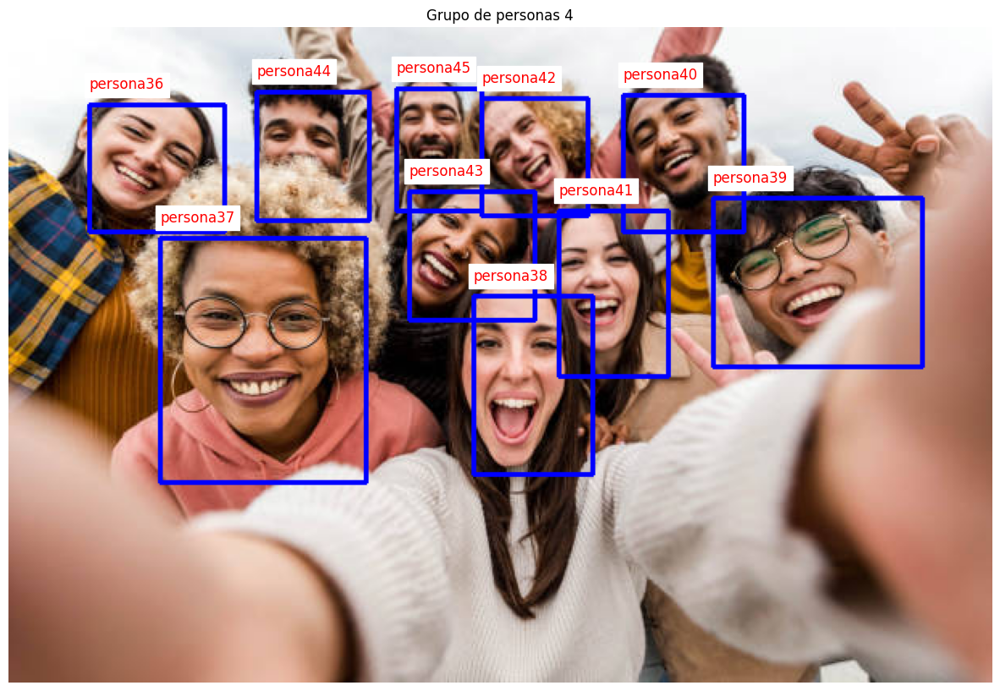

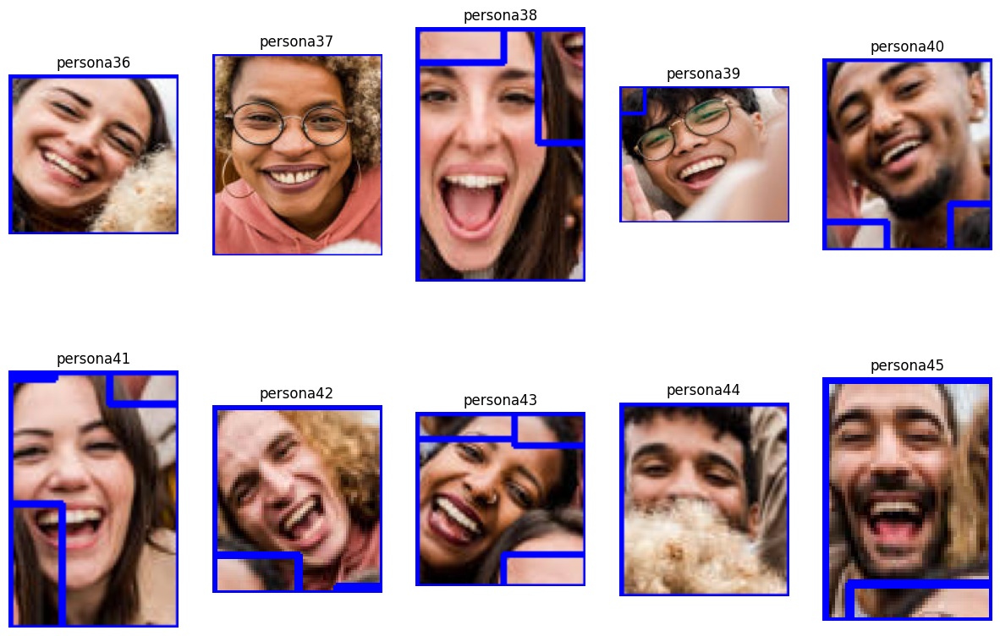

Forma de grupo4: (10, 224, 224, 3)


In [ ]:
# Create an empty list to store the cropped faces from the image
grupo4 = []

# Provided data containing the bounding box coordinates and image metadata
data = {
    "boxes": [
        {"label": "persona36", "x": "50.98", "y": "48.81", "width": "84.44", "height": "79.32"},
        {"label": "persona37", "x": "94.33", "y": "131.29", "width": "128.88", "height": "152.35"},
        {"label": "persona38", "x": "289.06", "y": "167.59", "width": "74.78", "height": "111.92"},
        {"label": "persona39", "x": "438.23", "y": "106.30", "width": "130.25", "height": "105.70"},
        {"label": "persona40", "x": "382.17", "y": "42.99", "width": "75.15", "height": "85.98"},
        {"label": "persona41", "x": "342.60", "y": "114.42", "width": "68.97", "height": "103.61"},
        {"label": "persona42", "x": "294.69", "y": "44.22", "width": "66.86", "height": "73.48"},
        {"label": "persona43", "x": "249.91", "y": "102.13", "width": "78.51", "height": "80.70"},
        {"label": "persona44", "x": "154.50", "y": "40.07", "width": "70.66", "height": "80.15"},
        {"label": "persona45", "x": "241.36", "y": "38.20", "width": "53.55", "height": "76.40"}
    ],
    "height": 408,
    "key": "istockphoto-1371940128-612x612.jpg",
    "width": 612
}

# Load the image from the provided path
image_path = data["key"]
image = cv2.imread(image_path)

# Check if the image was loaded correctly
if image is None:
    print(f"Error loading {image_path}")
else:
    # Extract the bounding box information
    bboxes = data["boxes"]

    # Plot the original image with bounding boxes
    plt.figure(figsize=(15, 15))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Group of People 4')

    # Loop through each bounding box and draw it on the image
    for bbox in bboxes:
        x = int(float(bbox["x"]))            # Convert X coordinate to integer
        y = int(float(bbox["y"]))            # Convert Y coordinate to integer
        width = int(float(bbox["width"]))    # Convert width to integer
        height = int(float(bbox["height"]))  # Convert height to integer

        # Draw the bounding box on the image in blue
        cv2.rectangle(image, (x, y), (x + width, y + height), (255, 0, 0), 2)

        # Add the label text above each bounding box
        plt.text(x, y - 10, bbox["label"], color='red', fontsize=12, backgroundcolor='white')

    # Display the image with all bounding boxes
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

    # Crop and display each face individually
    plt.figure(figsize=(15, 15))
    for i, bbox in enumerate(bboxes):
        x = int(float(bbox["x"]))            # Convert X coordinate to integer
        y = int(float(bbox["y"]))            # Convert Y coordinate to integer
        width = int(float(bbox["width"]))    # Convert width to integer
        height = int(float(bbox["height"]))  # Convert height to integer

        # Crop the face region from the image using the bounding box
        face = image[y:y+height, x:x+width]

        # Resize the cropped face to 224x224 pixels (for model input compatibility)
        face_resized = cv2.resize(face, (224, 224))

        # Store the resized face in the grupo4 list
        grupo4.append(face_resized)

        # Display each cropped face in a subplot
        plt.subplot(3, 5, i + 1)  # 3 rows x 5 columns layout
        plt.imshow(cv2.cvtColor(face, cv2.COLOR_BGR2RGB))
        plt.title(f'{bbox["label"]}')
        plt.axis('off')

    plt.show()

# Convert the list of cropped faces to a NumPy array
grupo4 = np.array(grupo4)

# Print the shape of the array to verify its dimensions
print("Shape of grupo4:", grupo4.shape)

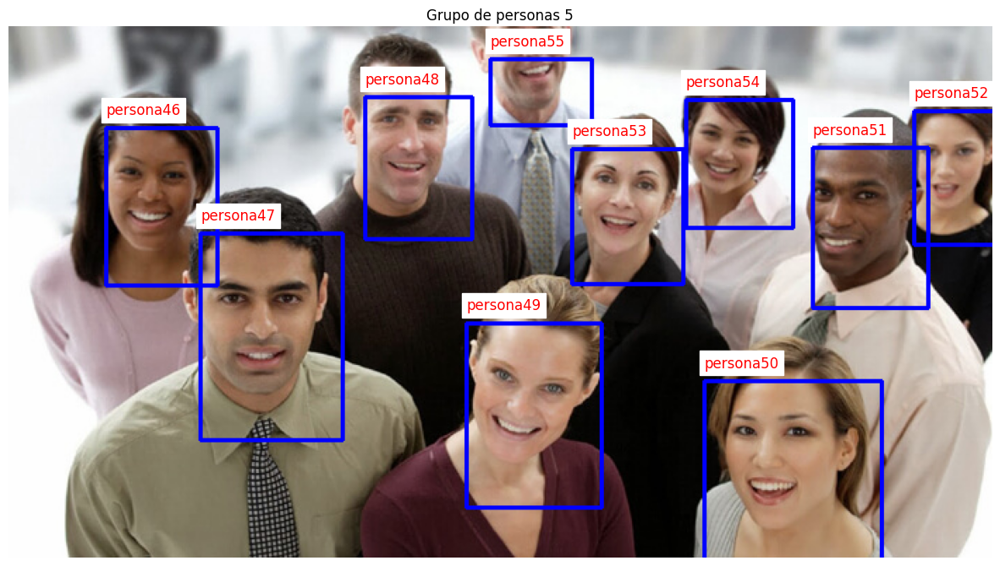

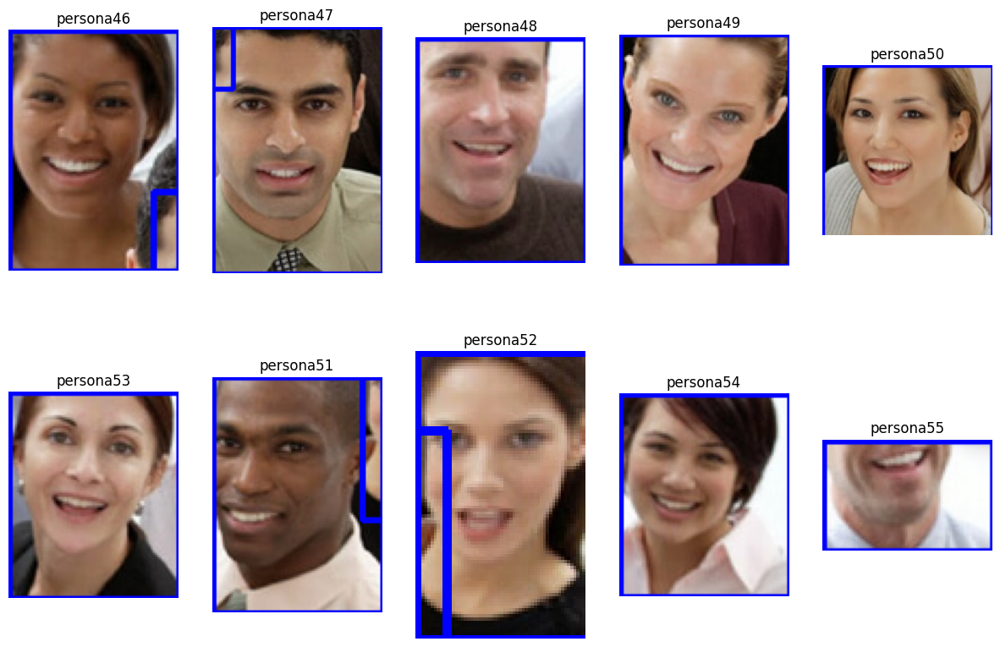

Forma de grupo5: (10, 224, 224, 3)


In [ ]:
# Create an empty list to store the cropped faces from the image
grupo5 = []

# Provided data containing the bounding box coordinates and image metadata
data = {
    "boxes": [
        {"label": "persona46", "x": "69.96", "y": "72.66", "width": "79.15", "height": "112.02"},
        {"label": "persona47", "x": "136.82", "y": "147.63", "width": "101.96", "height": "147.64"},
        {"label": "persona48", "x": "253.44", "y": "50.81", "width": "76.49", "height": "101.62"},
        {"label": "persona49", "x": "325.10", "y": "211.03", "width": "96.08", "height": "131.74"},
        {"label": "persona50", "x": "494.51", "y": "252.53", "width": "126.02", "height": "139.18"},
        {"label": "persona53", "x": "400.83", "y": "87.11", "width": "79.40", "height": "96.46"},
        {"label": "persona51", "x": "571.72", "y": "86.18", "width": "82.67", "height": "114.62"},
        {"label": "persona52", "x": "643.93", "y": "60.21", "width": "58.81", "height": "95.83"},
        {"label": "persona54", "x": "481.56", "y": "52.99", "width": "76.15", "height": "91.77"},
        {"label": "persona55", "x": "342.89", "y": "23.88", "width": "72.77", "height": "47.77"}
    ],
    "height": 378,
    "key": "procesos-grupales.jpg",
    "width": 699
}

# Load the image from the provided path
image_path = data["key"]
image = cv2.imread(image_path)

# Check if the image was loaded correctly
if image is None:
    print(f"Error loading {image_path}")
else:
    # Extract the bounding box information
    bboxes = data["boxes"]

    # Plot the original image with bounding boxes
    plt.figure(figsize=(15, 15))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Group of People 5')

    # Loop through each bounding box and draw it on the image
    for bbox in bboxes:
        x = int(float(bbox["x"]))            # Convert X coordinate to integer
        y = int(float(bbox["y"]))            # Convert Y coordinate to integer
        width = int(float(bbox["width"]))    # Convert width to integer
        height = int(float(bbox["height"]))  # Convert height to integer

        # Draw the bounding box on the image in blue
        cv2.rectangle(image, (x, y), (x + width, y + height), (255, 0, 0), 2)

        # Add the label text above each bounding box
        plt.text(x, y - 10, bbox["label"], color='red', fontsize=12, backgroundcolor='white')

    # Display the image with all bounding boxes
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

    # Crop and display each face individually
    plt.figure(figsize=(15, 15))
    for i, bbox in enumerate(bboxes):
        x = int(float(bbox["x"]))            # Convert X coordinate to integer
        y = int(float(bbox["y"]))            # Convert Y coordinate to integer
        width = int(float(bbox["width"]))    # Convert width to integer
        height = int(float(bbox["height"]))  # Convert height to integer

        # Crop the face region from the image using the bounding box
        face = image[y:y+height, x:x+width]

        # Resize the cropped face to 224x224 pixels (for model input compatibility)
        face_resized = cv2.resize(face, (224, 224))

        # Store the resized face in the grupo5 list
        grupo5.append(face_resized)

        # Display each cropped face in a subplot
        plt.subplot(3, 5, i + 1)  # 3 rows x 5 columns layout
        plt.imshow(cv2.cvtColor(face, cv2.COLOR_BGR2RGB))
        plt.title(f'{bbox["label"]}')
        plt.axis('off')

    plt.show()

# Convert the list of cropped faces to a NumPy array
grupo5 = np.array(grupo5)

# Print the shape of the array to verify its dimensions
print("Shape of grupo5:", grupo5.shape)


### Model predictions with each group



In [ ]:
# Make predictions for group 1
y_pred_grupo1 = modelo1.predict(grupo1)

# Define the threshold for binary classification
threshold = 0.5

# Convert continuous predictions (probabilities) into binary labels (0 or 1)
y_pred_g1 = (y_pred_grupo1 >= threshold).astype(int)

1/1 [==============================] - 5s 5s/step


In [ ]:
# Make predictions for group 2
y_pred_grupo2 = modelo1.predict(grupo2)

# Define the threshold for binary classification
threshold = 0.5

# Convert continuous predictions (probabilities) into binary labels (0 or 1)
y_pred_g2 = (y_pred_grupo2 >= threshold).astype(int)

1/1 [==============================] - 4s 4s/step


In [ ]:
# Make predictions for group 3
y_pred_grupo3 = modelo1.predict(grupo3)

# Define the threshold for binary classification
threshold = 0.5

# Convert continuous predictions (probabilities) into binary labels (0 or 1)
y_pred_g3 = (y_pred_grupo3 >= threshold).astype(int)

1/1 [==============================] - 4s 4s/step


In [ ]:
# Make predictions for group 4
y_pred_grupo4 = modelo1.predict(grupo4)

# Define the threshold for binary classification
threshold = 0.5

# Convert continuous predictions (probabilities) into binary labels (0 or 1)
y_pred_g4 = (y_pred_grupo4 >= threshold).astype(int)

1/1 [==============================] - 0s 451ms/step


In [ ]:
# Make predictions for group 5
y_pred_grupo5 = modelo1.predict(grupo5)

# Define the threshold for binary classification
threshold = 0.5

# Convert continuous predictions (probabilities) into binary labels (0 or 1)
y_pred_g5 = (y_pred_grupo5 >= threshold).astype(int)

1/1 [==============================] - 1s 565ms/step


In [ ]:
# Create an empty list to store the predictions of all groups
y_pred_grupos = []

# Append the binary predictions of each group to the list
y_pred_grupos.append(y_pred_g1)
y_pred_grupos.append(y_pred_g2)
y_pred_grupos.append(y_pred_g3)
y_pred_grupos.append(y_pred_g4)
y_pred_grupos.append(y_pred_g5)

In [ ]:
# Print the list containing the binary predictions of all groups
# Each element in the list corresponds to the predictions for one group
print(y_pred_grupos)

[array([[0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0]]), array([[0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0]]), array([[0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0]]), array([[0],
       [1],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [1]]), array([[1],
       [0],
       [0],
       [0],
       [0],
       [0],
       [1],
       [0],
       [0],
       [0]])]
